<img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<br>
<b>Notebook comparing diaSources from preconvolution+filtering vs template convolution</b> <br>
Contact author: Ian Sullivan<br>
Last verified to run: 28 July 2023<br>
LSST Science Piplines version: w_2023_34<br>
Run with a local ap_verify run of ap_verify_ci_hits2015
Medium size container


## Run details

Baseline run in comparison with pre-convolution

* Used weekly `w_2023_38`



### 1. Main package imports

In [1]:
import os
import importlib
import pprint

In [2]:
import matplotlib.pyplot as plt
#%matplotlib widget
%matplotlib inline

import numpy as np
import pandas as pd

In [3]:
import astropy.units as u
from astropy.coordinates import SkyCoord

In [4]:
import lsst.afw.display as afwDisplay
import lsst.geom

import lsst.daf.butler as dafButler
import lsst.pipe.base

In [5]:
!setup -r ../../build/analysis_ap -j

setup: /home/s/sullii/notebooks/build/analysis_ap doesn't seem to exist


In [6]:
!eups list analysis_ap

   LOCAL:/home/s/sullii/project/build/analysis_ap 	setup


In [7]:
from lsst.analysis.ap import apdb

In [8]:
from lsst.analysis.ap import legacyApdbUtils as utils
from lsst.analysis.ap import legacyPlotUtils as plac
from lsst.analysis.ap import nb_utils

In [9]:
from astropy.table import Table

In [10]:
importlib.reload(plac)

<module 'lsst.analysis.ap.legacyPlotUtils' from '/home/s/sullii/project/build/analysis_ap/python/lsst/analysis/ap/legacyPlotUtils.py'>

In [11]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

importlib.reload(utils)

<module 'lsst.analysis.ap.legacyApdbUtils' from '/home/s/sullii/project/build/analysis_ap/python/lsst/analysis/ap/legacyApdbUtils.py'>

### 2. Data access config
We are comparing multiple runs now, so we have to define where to find the data and the APDBs for each run.

#### Keys for default run.

In [12]:
repo = '/sdf/group/rubin/repo/main/'
collections = 'u/sullii/DM-39275/convolveTemplate'
instrument = 'HSC'
skymap = 'hsc_rings_v1'

butler = dafButler.Butler(repo, collections=collections)

dbType='postgres'
schema="sullii_dm39275_hsc_appipe_convolveTemplate"

reader = apdb.ApdbPostgresQuery(schema, butler=butler, instrument='HSC')

In [13]:
len(reader._tables)

5

In [14]:
default_run = {
    'repo': repo,
    'collections': collections,
    'instrument': instrument,
    'skymap': skymap,
    'butler': butler,
    'dbType': dbType,
    'dbName': schema,
    'reader': reader
}

In [15]:
default_run['run_name'] = 'Convolve template'

#### This set is for auto-convolution

In [16]:
repo = '/sdf/group/rubin/repo/main/'
collections = 'u/sullii/DM-39275/convolveAuto'
instrument = 'HSC'
skymap = 'hsc_rings_v1'

butler = dafButler.Butler(repo, collections=collections)

dbType='postgres'
schema="sullii_dm39275_hsc_appipe_convolveAuto"

reader = apdb.ApdbPostgresQuery(schema, butler=butler, instrument='HSC')

In [17]:
auto_run = {
    'repo': repo,
    'collections': collections,
    'instrument': instrument,
    'skymap': skymap,
    'butler': butler,
    'dbType': dbType,
    'dbName': schema,
    'reader': reader
}

In [18]:
auto_run['run_name'] = 'Auto convolution'

#### This set is for pre-convolution using the code from the branch `tickets/DM-39976` of `ip_diffim` (now merged to `main`)

In [19]:
repo = '/sdf/group/rubin/repo/main/'
collections = 'u/sullii/DM-39275/preconvolve'
instrument = 'HSC'
skymap = 'hsc_rings_v1'

butler = dafButler.Butler(repo, collections=collections)

dbType='postgres'
schema="sullii_dm39275_hsc_appipe_preconvolve"

reader = apdb.ApdbPostgresQuery(schema, butler=butler, instrument='HSC')

In [20]:
preconv_run = {
    'repo': repo,
    'collections': collections,
    'instrument': instrument,
    'skymap': skymap,
    'butler': butler,
    'dbType': dbType,
    'dbName': schema,
    'reader': reader
}

In [21]:
preconv_run['run_name'] = 'Pre-convolution'

## A. Analysis of Sources

### 3. Number of detections
Now loading the tables to compare among them

In [22]:
default_run['robjTable'] = default_run['reader'].load_objects()
default_run['rsrcTable'] = default_run['reader'].load_sources()

In [23]:
auto_run['robjTable'] = auto_run['reader'].load_objects()
auto_run['rsrcTable'] = auto_run['reader'].load_sources()

In [24]:
preconv_run['robjTable'] = preconv_run['reader'].load_objects()
preconv_run['rsrcTable'] = preconv_run['reader'].load_sources()

Look at how many objects and sources we picked right from the reader

In [25]:
n_objs = pd.DataFrame()

In [26]:
n_objs.loc['default', 'n_rdiasrc'] = len(default_run['rsrcTable'])
n_objs.loc['auto', 'n_rdiasrc'] = len(auto_run['rsrcTable'])
n_objs.loc['preconv', 'n_rdiasrc'] = len(preconv_run['rsrcTable'])

In [27]:
n_objs.loc['default', 'n_rdiaobj'] = len(default_run['robjTable'])
n_objs.loc['auto', 'n_rdiaobj'] = len(auto_run['robjTable'])
n_objs.loc['preconv', 'n_rdiaobj'] = len(preconv_run['robjTable'])

In [28]:
n_objs

,n_rdiasrc,n_rdiaobj
default,32339.0,26636.0
auto,32053.0,26463.0
preconv,29741.0,24038.0


In [29]:
object_columns = ['diaObjectId', 'ra', 'dec', 'nDiaSources', 'g_psfFluxMean', 
                  'r_psfFluxMean', 'i_psfFluxMean', 'z_psfFluxMean', 'y_psfFluxMean',
                  'validityEnd', 'flags']

In [30]:
source_columns = ['diaSourceId', 'diaObjectId', 'ra', 'dec', 'ccdVisitId', 'midpointMjdTai',
                  'apFlux', 'psfFlux', 'apFluxErr', 'psfFluxErr', 'scienceFlux', 'scienceFluxErr',
                  'snr', 'x', 'y', 'ixxPSF', 'iyyPSF', 'ixyPSF', 'flags', 'reliability', 'band',
                  'visit', 'detector', 'instrument']

In [31]:
table1 = default_run['robjTable'][default_run['robjTable'].validityEnd.isnull()]

Inspect the columns of the object table

In [32]:
for c in table1.columns:
    print(c)

diaObjectId
validityStart
validityEnd
ra
raErr
dec
decErr
ra_dec_Cov
radecMjdTai
pmRa
pmRaErr
pmDec
pmDecErr
parallax
parallaxErr
pmRa_pmDec_Cov
pmRa_parallax_Cov
pmDec_parallax_Cov
pmParallaxLnL
pmParallaxChi2
pmParallaxNdata
u_psfFluxMean
u_psfFluxMeanErr
u_psfFluxSigma
u_psfFluxChi2
u_psfFluxNdata
u_fpFluxMean
u_fpFluxMeanErr
u_fpFluxSigma
g_psfFluxMean
g_psfFluxMeanErr
g_psfFluxSigma
g_psfFluxChi2
g_psfFluxNdata
g_fpFluxMean
g_fpFluxMeanErr
g_fpFluxSigma
r_psfFluxMean
r_psfFluxMeanErr
r_psfFluxSigma
r_psfFluxChi2
r_psfFluxNdata
r_fpFluxMean
r_fpFluxMeanErr
r_fpFluxSigma
i_psfFluxMean
i_psfFluxMeanErr
i_psfFluxSigma
i_psfFluxChi2
i_psfFluxNdata
i_fpFluxMean
i_fpFluxMeanErr
i_fpFluxSigma
z_psfFluxMean
z_psfFluxMeanErr
z_psfFluxSigma
z_psfFluxChi2
z_psfFluxNdata
z_fpFluxMean
z_fpFluxMeanErr
z_fpFluxSigma
y_psfFluxMean
y_psfFluxMeanErr
y_psfFluxSigma
y_psfFluxChi2
y_psfFluxNdata
y_fpFluxMean
y_fpFluxMeanErr
y_fpFluxSigma
u_lcPeriodic
g_lcPeriodic
r_lcPeriodic
i_lcPeriodic
z_lcPeriodic


Inspect the columns of the source table

In [33]:
table2 = default_run['rsrcTable']

In [34]:
for c in table2.columns:
    print(c)

diaSourceId
ccdVisitId
diaObjectId
ssObjectId
parentDiaSourceId
ssObjectReassocTime
midpointMjdTai
ra
raErr
dec
decErr
ra_dec_Cov
x
xErr
y
yErr
x_y_Cov
apFlux
apFluxErr
snr
psfFlux
psfFluxErr
psfRa
psfRaErr
psfDec
psfDecErr
psfFlux_psfRa_Cov
psfFlux_psfDec_Cov
psfRa_psfDec_Cov
psfLnL
psfChi2
psfNdata
trailFlux
trailFluxErr
trailRa
trailRaErr
trailDec
trailDecErr
trailLength
trailLengthErr
trailAngle
trailAngleErr
trailFlux_trailRa_Cov
trailFlux_trailDec_Cov
trailFlux_trailLength_Cov
trailFlux_trailAngle_Cov
trailRa_trailDec_Cov
trailRa_trailLength_Cov
trailRa_trailAngle_Cov
trailDec_trailLength_Cov
trailDec_trailAngle_Cov
trailLength_trailAngle_Cov
trailLnL
trailChi2
trailNdata
dipoleMeanFlux
dipoleMeanFluxErr
dipoleFluxDiff
dipoleFluxDiffErr
dipoleRa
dipoleRaErr
dipoleDec
dipoleDecErr
dipoleLength
dipoleLengthErr
dipoleAngle
dipoleAngleErr
dipoleMeanFlux_dipoleFluxDiff_Cov
dipoleMeanFlux_dipoleRa_Cov
dipoleMeanFlux_dipoleDec_Cov
dipoleMeanFlux_dipoleLength_Cov
dipoleMeanFlux_dipoleAng

In [35]:
ccdVisitIds = set(table2['ccdVisitId'])

In [36]:
ccdVisitIds

{2338049,
 2338050,
 2338057,
 2338058,
 2338065,
 2338066,
 2338449,
 2338450,
 2338457,
 2338458,
 2338465,
 2338466,
 2338849,
 2338850,
 2338857,
 2338858,
 2338865,
 2338866,
 2339249,
 2339250,
 2339257,
 2339258,
 2339265,
 2339266,
 2339649,
 2339650,
 2339657,
 2339658,
 2339665,
 2339666,
 2340049,
 2340050,
 2340057,
 2340058,
 2340065,
 2340066,
 2340449,
 2340450,
 2340457,
 2340458,
 2340465,
 2340466,
 2340849,
 2340850,
 2340857,
 2340858,
 2340865,
 2340866,
 2341249,
 2341250,
 2341257,
 2341258,
 2341265,
 2341266,
 2341649,
 2341650,
 2341657,
 2341658,
 2341665,
 2341666,
 2342049,
 2342050,
 2342057,
 2342058,
 2342065,
 2342066,
 2342449,
 2342450,
 2342457,
 2342458,
 2342465,
 2342466,
 5864849,
 5864850,
 5864857,
 5864858,
 5864865,
 5864866,
 5865249,
 5865250,
 5865257,
 5865258,
 5865265,
 5865266,
 5867249,
 5867250,
 5867257,
 5867258,
 5867265,
 5867266,
 5868049,
 5868050,
 5868057,
 5868058,
 5868065,
 5868066,
 5870049,
 5870050,
 5870057,
 5870058,


Now filter the objects which are not valid and pick the useful columns.

In [37]:
default_run['objTable'] = default_run['robjTable'][default_run['robjTable'].validityEnd.isnull()][object_columns]
preconv_run['objTable'] = preconv_run['robjTable'][preconv_run['robjTable'].validityEnd.isnull()][object_columns]
auto_run['objTable'] = auto_run['robjTable'][auto_run['robjTable'].validityEnd.isnull()][object_columns]

In [38]:
default_run['srcTable'] = default_run['rsrcTable'][source_columns]
auto_run['srcTable'] = auto_run['rsrcTable'][source_columns]
preconv_run['srcTable'] = preconv_run['rsrcTable'][source_columns]

Check numbers once more

In [39]:
n_objs.loc['default', 'n_diasrc'] = len(default_run['srcTable'])
n_objs.loc['auto', 'n_diasrc'] = len(auto_run['srcTable'])
n_objs.loc['preconv', 'n_diasrc'] = len(preconv_run['srcTable'])

In [40]:
n_objs.loc['default', 'n_diaobj'] = len(default_run['objTable'])
n_objs.loc['auto', 'n_diaobj'] = len(auto_run['objTable'])
n_objs.loc['preconv', 'n_diaobj'] = len(preconv_run['objTable'])

In [41]:
n_objs

,n_rdiasrc,n_rdiaobj,n_diasrc,n_diaobj
default,32339.0,26636.0,32339.0,26636.0
auto,32053.0,26463.0,32053.0,26463.0
preconv,29741.0,24038.0,29741.0,24038.0


Note that no objects were filtered out by the above check

### 4. Flags 
Loading up the flag tables now

In [42]:
badFlagList = [
    'base_PixelFlags_flag_bad',
    'base_PixelFlags_flag_suspect',
    'base_PixelFlags_flag_saturatedCenter',
    'base_PixelFlags_flag_interpolated',
    'base_PixelFlags_flag_interpolatedCenter',
    'base_PixelFlags_flag_edge'
    ]

In [43]:
from lsst.ap.association import UnpackApdbFlags, TransformDiaSourceCatalogConfig

In [44]:
import functools
import operator

In [45]:
config = TransformDiaSourceCatalogConfig()
unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')

In [46]:
def add_flag_tables(run_dict, badFlagList):
    """
    Unpack the flags and add the resulting tables to the run dictionary
    """
    run_dict['flagValues'] = unpacker.unpack(run_dict['srcTable']['flags'], 'flags')
    run_dict['flagTable'] = pd.DataFrame(run_dict['flagValues'], index=run_dict['srcTable'].index)

    run_dict['srcTableFlags'] = pd.merge(run_dict['srcTable'], run_dict['flagTable'], left_index=True, right_index=True)
    
    badFlags = [run_dict['srcTableFlags'][flag] for flag in badFlagList]
    flagFilter = functools.reduce(operator.or_, badFlags)
    noFlagFilter = ~flagFilter

    run_dict['goodSrc'] = run_dict['srcTableFlags'].loc[noFlagFilter]

    run_dict['goodObjIds'] = set(run_dict['srcTableFlags'].loc[noFlagFilter, 'diaObjectId'])

    run_dict['goodObj'] = run_dict['objTable'].loc[run_dict['objTable']['diaObjectId'].isin(run_dict['goodObjIds'])]

    run_dict['badSrc'] = run_dict['srcTableFlags'].loc[flagFilter]

    run_dict['badObjIds'] = set(run_dict['srcTableFlags'].loc[flagFilter, 'diaObjectId'])

    run_dict['badObj'] = run_dict['objTable'].loc[run_dict['objTable']['diaObjectId'].isin(run_dict['badObjIds'])]
    
    return flagFilter, noFlagFilter

In [47]:
flagFilter, noFlagFilter = add_flag_tables(default_run, badFlagList)
flagFilter0, noFlagFilter0 = add_flag_tables(auto_run, badFlagList)
flagFilter1, noFlagFilter1 = add_flag_tables(preconv_run, badFlagList)

In [48]:
n_objs.loc['default', 'n_good_diaobj'] = len(default_run['goodObj'])
n_objs.loc['auto', 'n_good_diaobj'] = len(auto_run['goodObj'])
n_objs.loc['preconv', 'n_good_diaobj'] = len(preconv_run['goodObj'])

In [49]:
n_objs.loc['default', 'n_good_diasrc'] = len(default_run['goodSrc'])
n_objs.loc['auto', 'n_good_diasrc'] = len(auto_run['goodSrc'])
n_objs.loc['preconv', 'n_good_diasrc'] = len(preconv_run['goodSrc'])

In [50]:
n_objs

,n_rdiasrc,n_rdiaobj,n_diasrc,n_diaobj,n_good_diaobj,n_good_diasrc
default,32339.0,26636.0,32339.0,26636.0,14725.0,17973.0
auto,32053.0,26463.0,32053.0,26463.0,14750.0,17922.0
preconv,29741.0,24038.0,29741.0,24038.0,14825.0,17232.0


Text(0, 0.5, 'N')

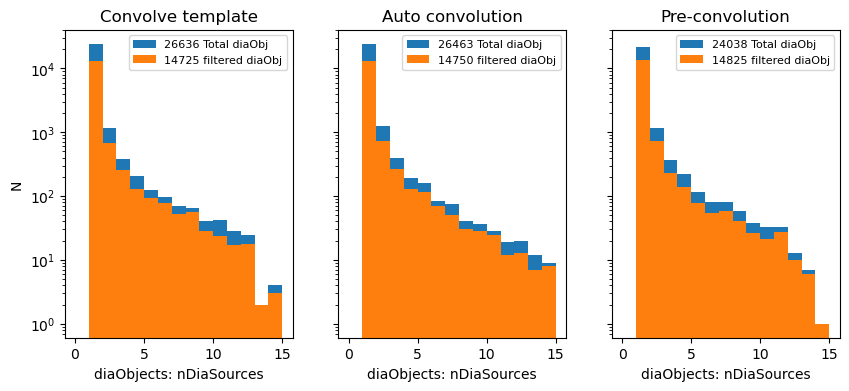

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharey=True)
nbins = 15
for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):
    #plt.figure(figsize=(12, 8))
    ax = axes.flatten()[i_run]

    ax.hist(run_dict['objTable'].nDiaSources, log=True, label=f"{len(run_dict['objTable'])} Total diaObj", bins=np.arange(nbins+1))
    #plt.xlabel('diaObjects: nDiaSources')
    #plt.legend(loc='best')

    ax.hist(run_dict['goodObj'].nDiaSources, log=True, label=f"{len(run_dict['goodObj'])} filtered diaObj", bins=np.arange(nbins+1))
    ax.set_xlabel('diaObjects: nDiaSources')
    ax.legend(loc='best', fontsize=8)
    ax.set_title(run_dict['run_name'])
axes.flatten()[0].set_ylabel('N')

Small differences in good objects, a moderate difference in the total number of objects

## 4.1 Real-bogus reliability scores

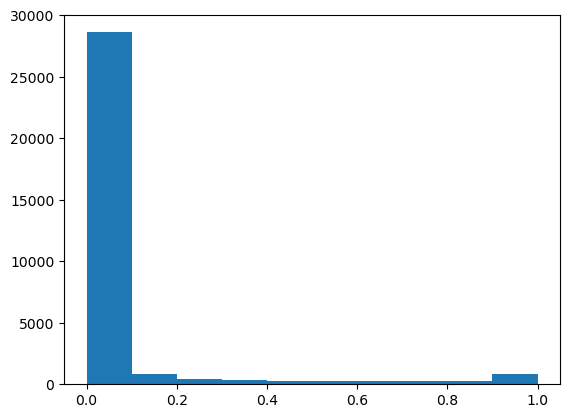

In [52]:
default_hist = plt.hist(default_run['srcTable']['reliability'])

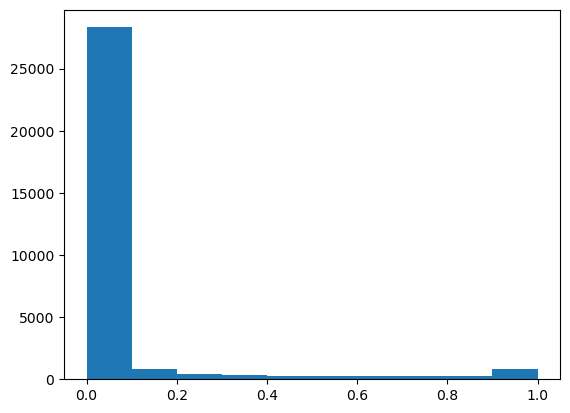

In [53]:
auto_hist = plt.hist(auto_run['srcTable']['reliability'])

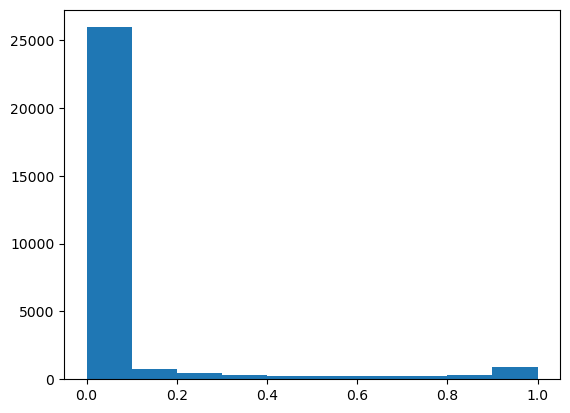

In [54]:
preconv_hist = plt.hist(preconv_run['srcTable']['reliability'])

In [55]:
reliability_table = pd.DataFrame()

In [56]:
reliability_table['reliability'] = np.around(default_hist[1][:-1], 3)

In [57]:
reliability_table[default_run['run_name']] = default_hist[0]
reliability_table[auto_run['run_name']] = auto_hist[0]
reliability_table[preconv_run['run_name']] = preconv_hist[0]

In [58]:
reliability_table

,reliability,Convolve template,Auto convolution,Pre-convolution
0,0.0,28607.0,28330.0,25939.0
1,0.1,800.0,792.0,762.0
2,0.2,448.0,449.0,433.0
3,0.3,313.0,315.0,306.0
4,0.4,273.0,276.0,267.0
5,0.5,234.0,232.0,265.0
6,0.6,231.0,238.0,271.0
7,0.7,274.0,268.0,277.0
8,0.8,305.0,296.0,339.0
9,0.9,854.0,857.0,882.0


In [59]:
print(default_hist[1][5])
print(np.sum(default_hist[0][5:]))
print(np.sum(auto_hist[0][5:]))
print(np.sum(preconv_hist[0][5:]))

0.5
1898.0
1891.0
2034.0


From the above table, there is a small change in the total number of diaSources with "good" reliability (above 0.5) between the pipeline default and using preconvolution. Auto-convolution produces very similar results to convolving the template, which is not too surprising given the small number of visits with seeing better than the template in this dataset. However, in the past convolving the science image would create a huge number of false detections, which have dominated these results. The significant change is with the number of diaSources with the worst reliability scores, indicating that the new version of preconvolution is eliminating spurious detections.

### Repeat with only good sources

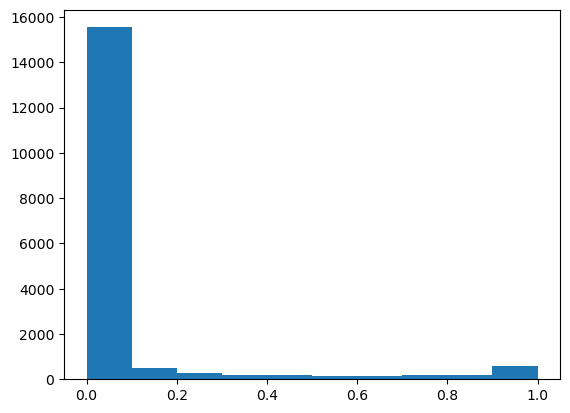

In [60]:
default_hist = plt.hist(default_run['goodSrc']['reliability'])

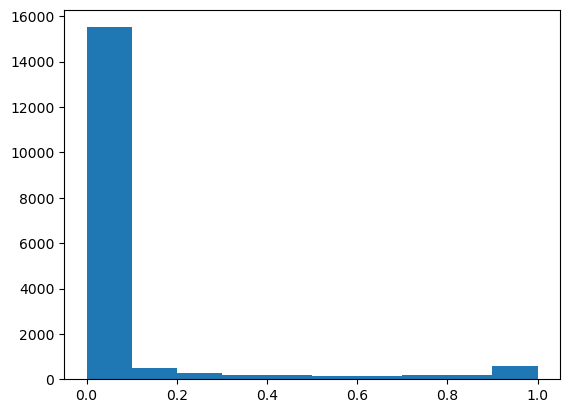

In [61]:
auto_hist = plt.hist(auto_run['goodSrc']['reliability'])

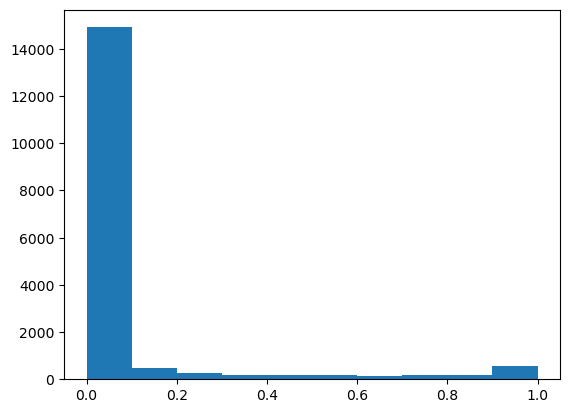

In [62]:
preconv_hist = plt.hist(preconv_run['goodSrc']['reliability'])

In [63]:
reliability_table = pd.DataFrame()

In [64]:
reliability_table['reliability'] = np.around(default_hist[1][:-1], 3)

In [65]:
reliability_table[default_run['run_name']] = default_hist[0]
reliability_table[auto_run['run_name']] = auto_hist[0]
reliability_table[preconv_run['run_name']] = preconv_hist[0]

In [66]:
reliability_table

,reliability,Convolve template,Auto convolution,Pre-convolution
0,0.0,15544.0,15512.0,14916.0
1,0.1,488.0,478.0,460.0
2,0.2,275.0,269.0,257.0
3,0.3,197.0,201.0,174.0
4,0.4,170.0,176.0,161.0
5,0.5,154.0,148.0,170.0
6,0.6,163.0,166.0,160.0
7,0.7,184.0,178.0,164.0
8,0.8,208.0,203.0,199.0
9,0.9,590.0,591.0,571.0


In [67]:
print(default_hist[1][5])
print(np.sum(default_hist[0][5:]))
print(np.sum(auto_hist[0][5:]))
print(np.sum(preconv_hist[0][5:]))

0.5000000000008812
1299.0
1286.0
1264.0


There is much less of a difference seen between the objects that are flagged as "good". 

## 5. Sky plots on sources

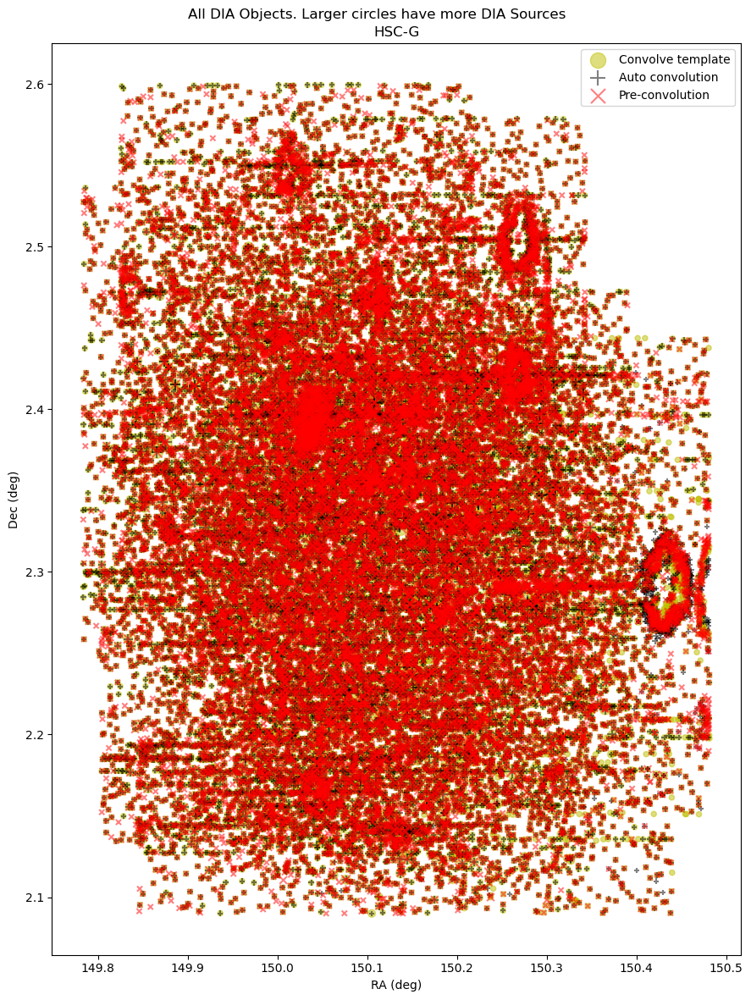

In [68]:
nSrc = 0  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)

fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('All DIA Objects. Larger circles have more DIA Sources')
ra_min = 149.75
ra_max = 150.5
dec_min = 2.09
dec_max = 2.6

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

#     xlim = [149.7, 149.5]
#     ylim = [2.7, 2.9]
    #plt.setp(axs, xlim=xlim, ylim=ylim)
    
    goodFilter = (run_dict['objTable']['nDiaSources'] > nSrc)
#     goodFilter = run_dict[]
    
#     axG = axs[i_run]
    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    ra = run_dict['objTable'].loc[goodFilter, 'ra']
    dec = run_dict['objTable'].loc[goodFilter, 'dec']
    size = run_dict['objTable'].loc[goodFilter, 'nDiaSources']*20
    coord_select = (ra > ra_min) & (ra < ra_max) & (dec > dec_min) & (dec < dec_max)

    ax.scatter(ra[coord_select],
               dec[coord_select],
               s=size[coord_select], 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

In [69]:
table_test = run_dict['goodObj']

In [70]:
table_test.columns

Index(['diaObjectId', 'ra', 'dec', 'nDiaSources', 'g_psfFluxMean',
       'r_psfFluxMean', 'i_psfFluxMean', 'z_psfFluxMean', 'y_psfFluxMean',
       'validityEnd', 'flags'],
      dtype='object')

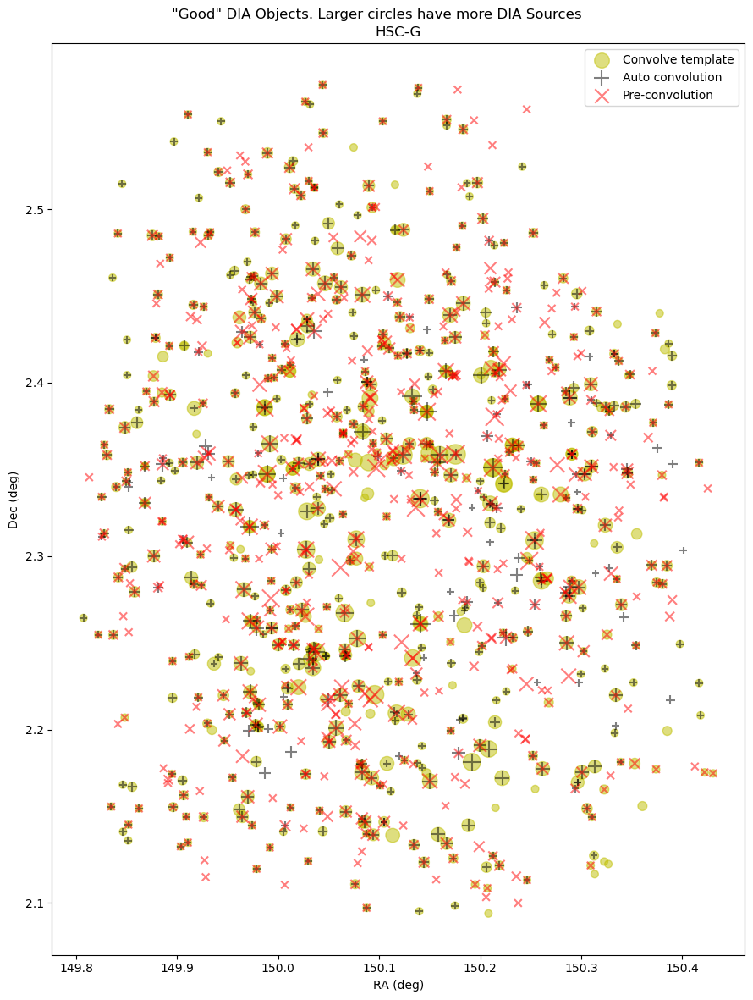

In [72]:
nSrc = 1  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)

fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('"Good" DIA Objects. Larger circles have more DIA Sources')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

#     xlim = [149.7, 149.5]
#     ylim = [2.7, 2.9]
    #plt.setp(axs, xlim=xlim, ylim=ylim)
    
    goodFilter = (run_dict['goodObj']['nDiaSources'] > nSrc) &\
                 (run_dict['goodObj']['g_psfFluxMean'] > 0)
#     goodFilter = run_dict[]
    
#     axG = axs[i_run]
    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']

    ax.scatter(run_dict['goodObj'].loc[goodFilter, 'ra'],
               run_dict['goodObj'].loc[goodFilter, 'dec'],
               s=run_dict['goodObj'].loc[goodFilter, 'nDiaSources']*20, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

There are few differences between the different flavors of diffim when looking at all of the "good" diaObjects, with any number of diaSources. Auto and template convolution are very similar when restricting to good diaObjects with more than a single diaSource, but there are a number of clear differences between those runs and preconvolution.

## 4.2 Comparison of diaSources between runs

In [73]:
objectTable1 = default_run['goodObj']
objectTable1b = auto_run['goodObj']
objectTable2 = preconv_run['goodObj']

In [74]:
objectTable1.columns

Index(['diaObjectId', 'ra', 'dec', 'nDiaSources', 'g_psfFluxMean',
       'r_psfFluxMean', 'i_psfFluxMean', 'z_psfFluxMean', 'y_psfFluxMean',
       'validityEnd', 'flags'],
      dtype='object')

In [75]:
obj_default, obj_preconv, obj_match = nb_utils.compare_sources(default_run['butler'], preconv_run['butler'],
                                                               default_run['reader'], preconv_run['reader'],
                                                               match_radius=0.2, display_cutouts=False,
                                                               bad_flag_list=badFlagList,
                                                               make_cutouts=False)

11769 matched sources; 6204 unique to set 1; 5469 unique to set 2.


In [76]:
obj_default2, obj_auto2, obj_match2 = nb_utils.compare_sources(default_run['butler'], auto_run['butler'],
                                                               default_run['reader'], auto_run['reader'],
                                                               match_radius=0.2, display_cutouts=False,
                                                               bad_flag_list=badFlagList,
                                                               make_cutouts=False)

16726 matched sources; 1247 unique to set 1; 1212 unique to set 2.


In [77]:
highObs_default = obj_default.diaSourceId[obj_default['reliability'] > 0.1]

In [81]:
highObs_auto = obj_auto2.diaSourceId[obj_auto2['reliability'] > 0.1]

In [78]:
highObs_preconv = obj_preconv.diaSourceId[obj_preconv['reliability'] > 0.1]

In [79]:
len(highObs_default)

1092

In [82]:
len(highObs_auto)

149

In [80]:
len(highObs_preconv)

971

### 5. Flag frequency analysis

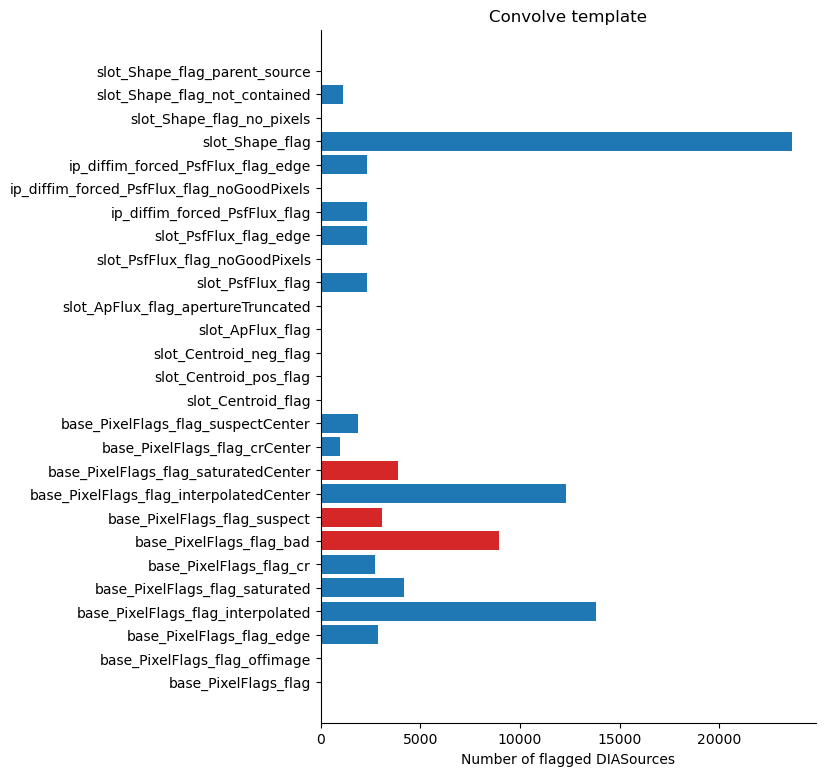

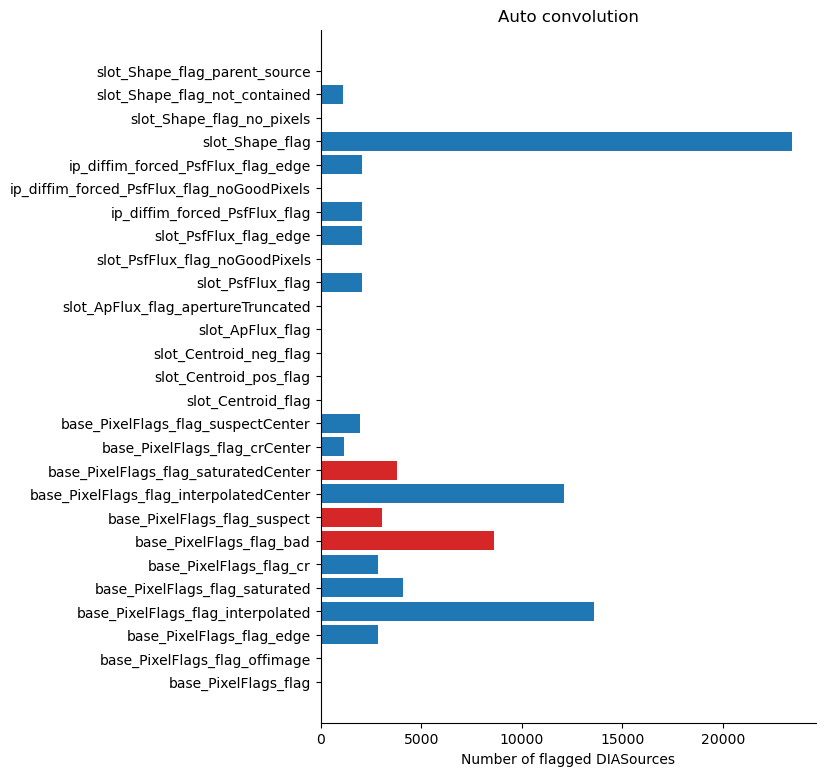

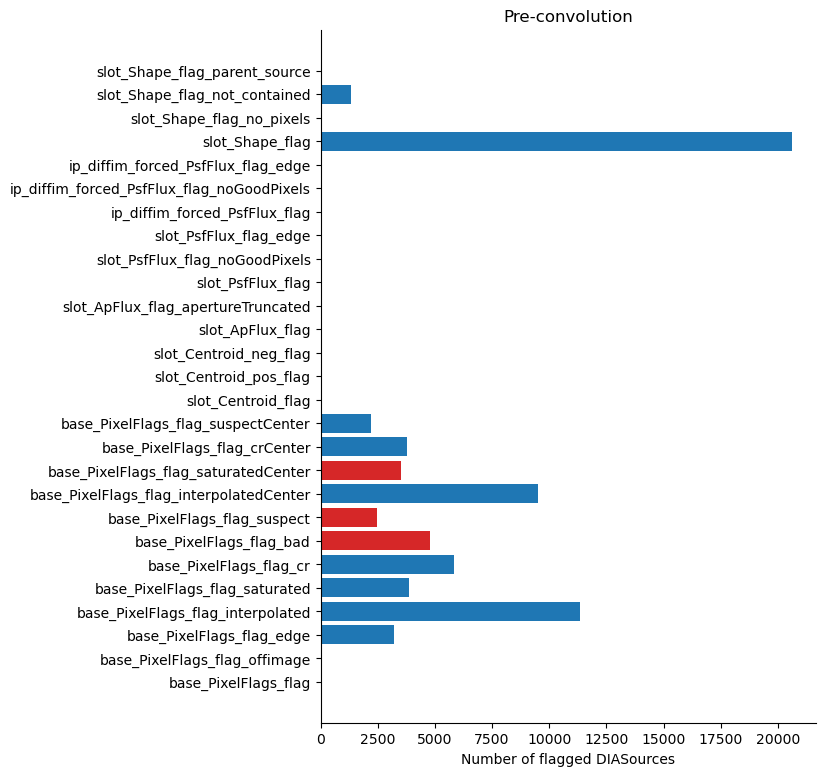

In [83]:
for arun in [default_run, auto_run, preconv_run]:
    repo = arun['repo']
    goodSrc = arun['goodSrc']
    collections = arun['collections']
    srcTable = arun['srcTable']
    
    plac.plotFlagHist(srcTable, title=f'{arun["run_name"]}')

### 6. diaSource reliability score

Compare diaSource reliability scores from real-bogus between runs.

In [84]:
ra = default_run['srcTable']['ra']

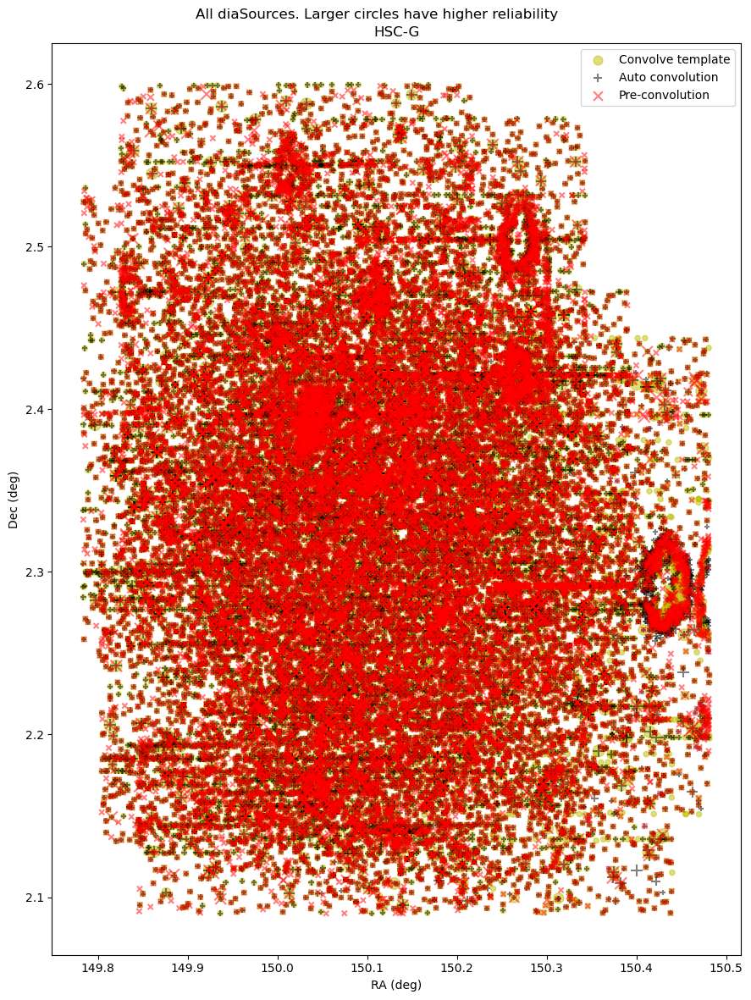

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('All diaSources. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    
    ra = run_dict['srcTable']['ra'].to_numpy()
    dec = run_dict['srcTable']['dec'].to_numpy()
    coord_select = (ra > ra_min) & (ra < ra_max) & (dec > dec_min) & (dec < dec_max)
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['srcTable']['reliability'].to_numpy()*100
    sizes = [max([s, 20]) for s in sizes[coord_select]]
    
    ax.scatter(ra[coord_select],
               dec[coord_select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

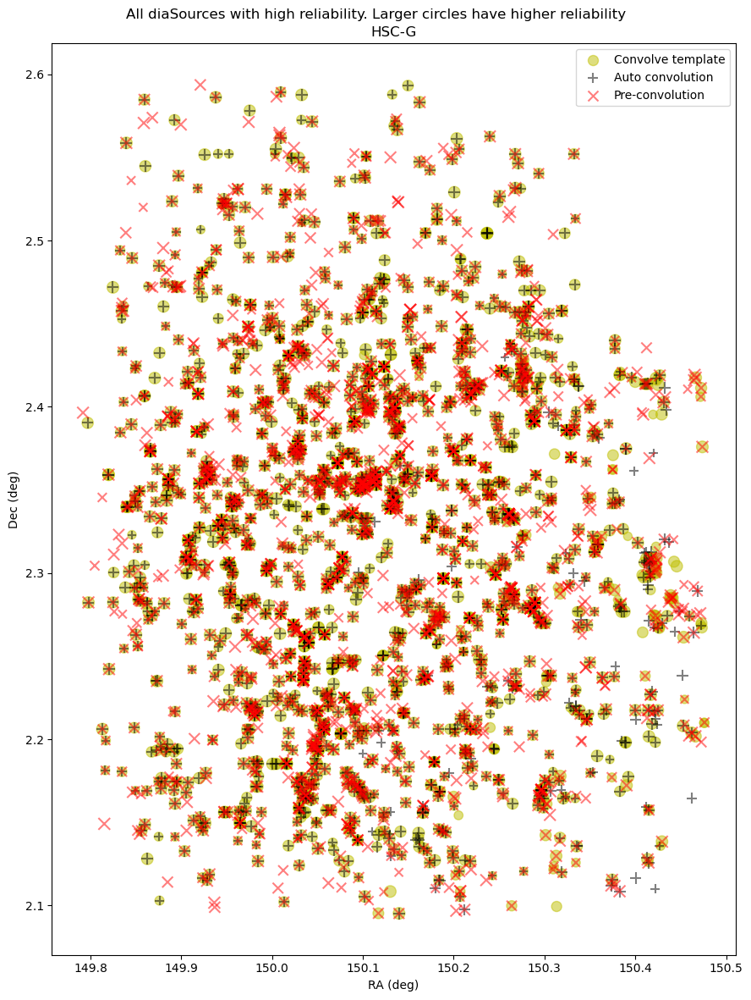

In [87]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('All diaSources with high reliability. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    
    ra = run_dict['srcTable']['ra'].to_numpy()
    dec = run_dict['srcTable']['dec'].to_numpy()
    coord_select = (ra > ra_min) & (ra < ra_max) & (dec > dec_min) & (dec < dec_max)
    
    reliability_select = run_dict['srcTable']['reliability'] > 0.5
    select = coord_select*reliability_select
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['srcTable']['reliability'].to_numpy()*100
    sizes = [max([s, 20]) for s in sizes[select]]
    
    ax.scatter(ra[select],
               dec[select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

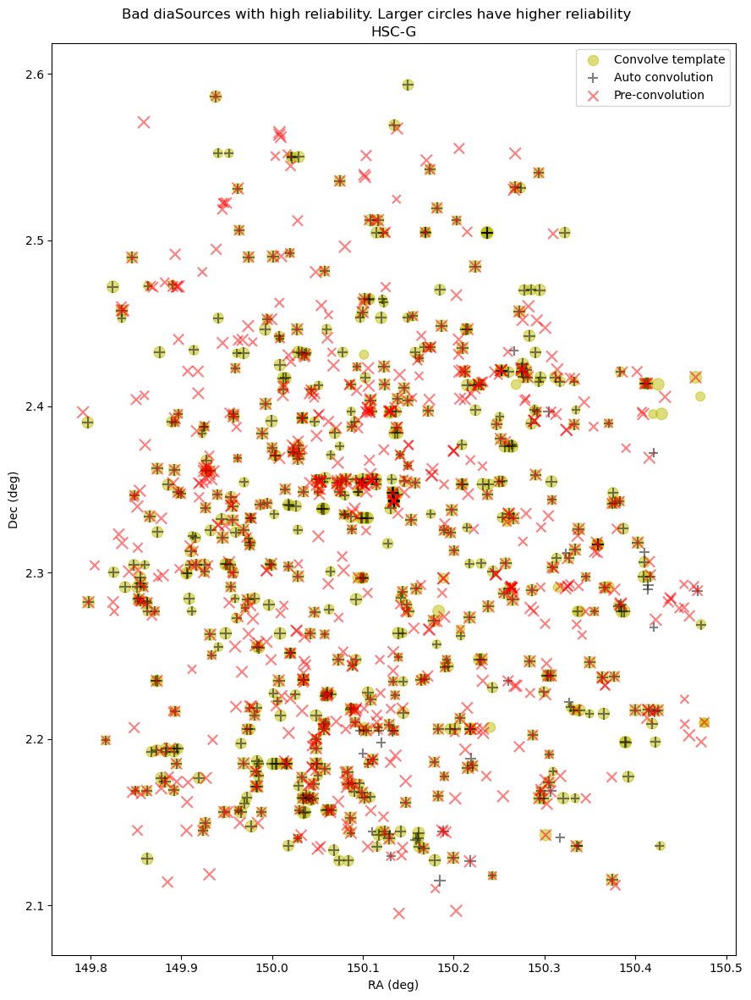

In [88]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('Bad diaSources with high reliability. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    
    ra = run_dict['badSrc']['ra'].to_numpy()
    dec = run_dict['badSrc']['dec'].to_numpy()
    coord_select = (ra > ra_min) & (ra < ra_max) & (dec > dec_min) & (dec < dec_max)
    
    reliability_select = run_dict['badSrc']['reliability'] > 0.5
    select = coord_select*reliability_select
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['badSrc']['reliability'].to_numpy()*100
    sizes = [max([s, 20]) for s in sizes[select]]
    
    ax.scatter(ra[select],
               dec[select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

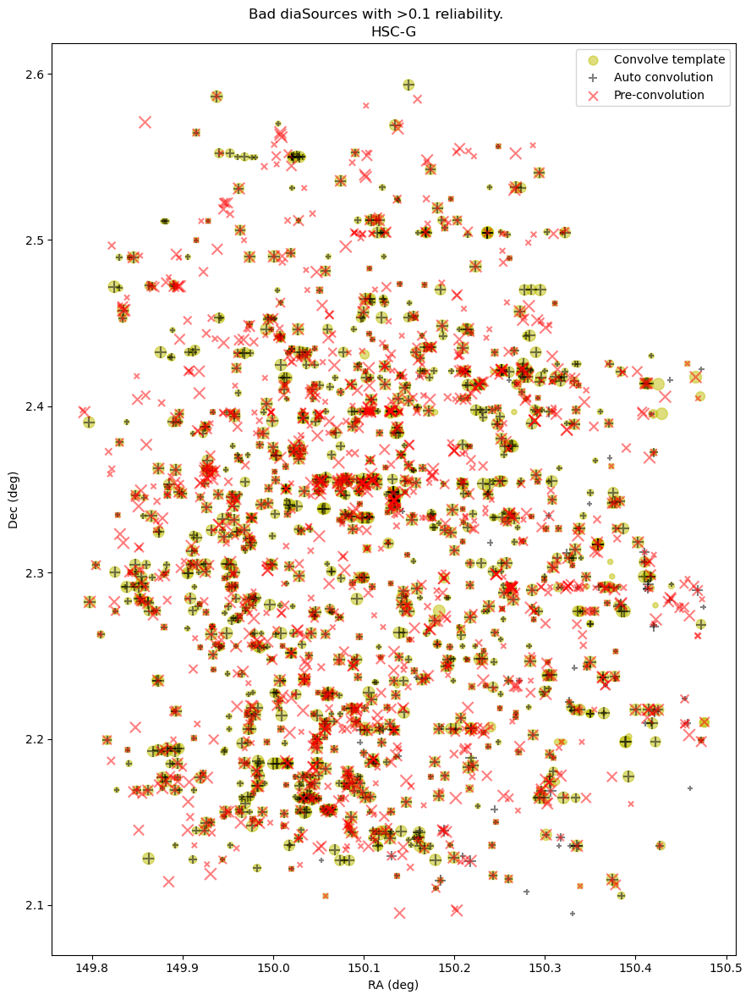

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

reliability_cut = .1
fig.suptitle(f'Bad diaSources with >{reliability_cut} reliability.')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    
    ra = run_dict['badSrc']['ra'].to_numpy()
    dec = run_dict['badSrc']['dec'].to_numpy()
    coord_select = (ra > ra_min) & (ra < ra_max) & (dec > dec_min) & (dec < dec_max)
    
    reliability_select = run_dict['badSrc']['reliability'] > reliability_cut
    select = coord_select*reliability_select
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['badSrc']['reliability'].to_numpy()*100
    sizes = [max([s, 20]) for s in sizes[select]]
    
    ax.scatter(ra[select],
               dec[select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

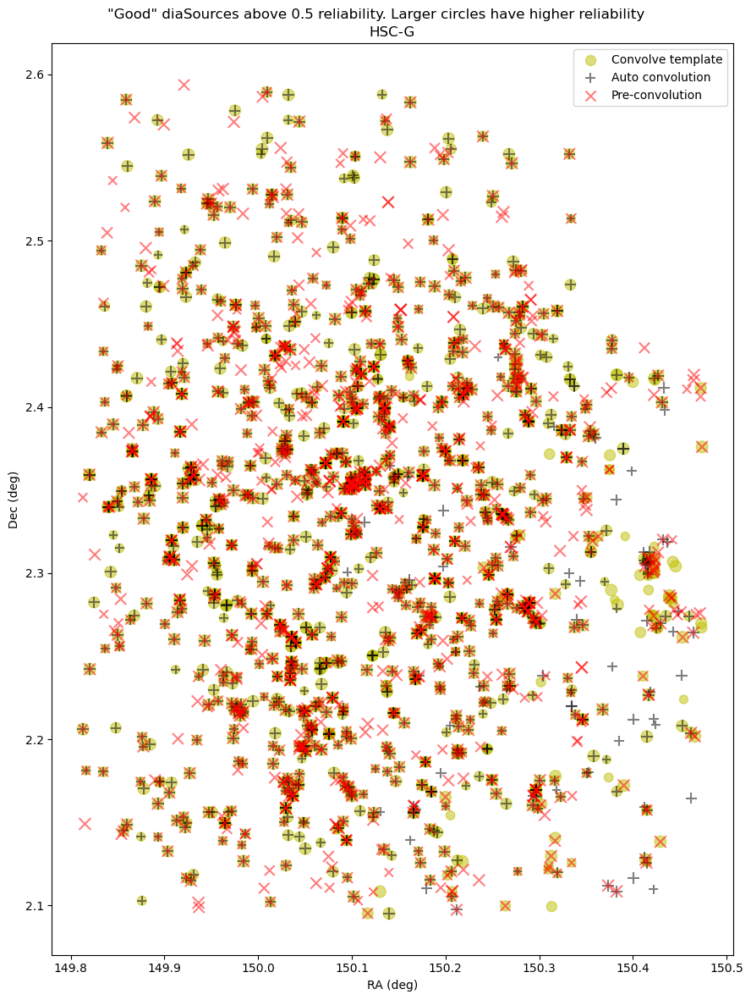

In [90]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

reliability_cut = .5
fig.suptitle(f'"Good" diaSources above {reliability_cut} reliability. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    reliability_select = run_dict['goodSrc']['reliability'] > reliability_cut
    sizes = run_dict['goodSrc']['reliability']*100
    sizes = [max([s, 20]) for s in sizes[reliability_select]]
    ra = run_dict['goodSrc']['ra'].to_numpy()
    dec = run_dict['goodSrc']['dec'].to_numpy()

    ax.scatter(ra[reliability_select],
               dec[reliability_select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

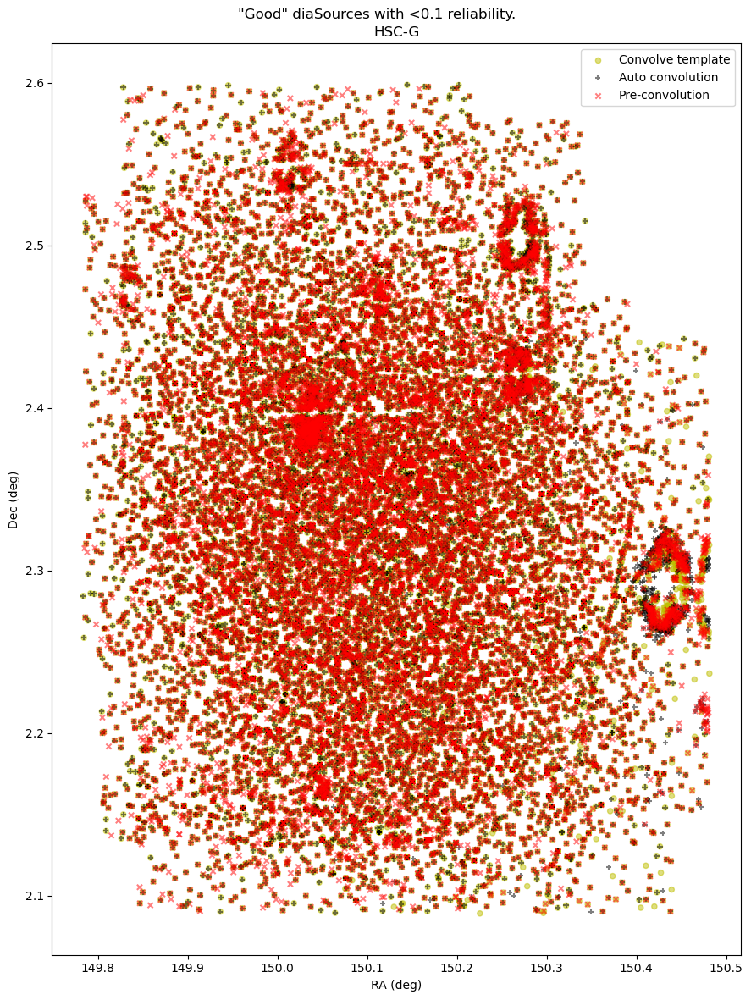

In [91]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

reliability_cut = 0.1
fig.suptitle(f'"Good" diaSources with <{reliability_cut} reliability.')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['goodSrc']['reliability']*100
    reliability_select = run_dict['goodSrc']['reliability'] < reliability_cut
    sizes = [max([s, 20]) for s in sizes[reliability_select]]

    ax.scatter(run_dict['goodSrc']['ra'][reliability_select],
               run_dict['goodSrc']['dec'][reliability_select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

# Visit statistics

In [92]:
from lsst.ip.diffim.utils import evaluateMeanPsfFwhm, getPsfFwhm

In [93]:
afwDisplay.setDefaultBackend('matplotlib')

In [94]:
butler = default_run["butler"]

In [95]:
visit_dict = {}
datasetRefs = list(butler.registry.queryDatasets("calexp", detector=50, band='g'))

In [96]:
datasetRef = datasetRefs[0]

In [97]:
temp = butler.get("goodSeeingDiff_templateExp", dataId=datasetRef.dataId)

In [98]:
getPsfFwhm(temp.psf)

3.9022796631931858

In [99]:
datasetRef.dataId['visit']

11690

In [100]:
for ref in datasetRefs:
    dataId = ref.dataId
    visit = dataId['visit']
    psf1 = butler.get("calexp.psf", dataId=dataId)
    psf2 = butler.get("goodSeeingDiff_templateExp.psf", dataId=dataId)
    single_dict = {"dataId": dataId, "sciPsfSize": getPsfFwhm(psf1), "templatePsfSize": getPsfFwhm(psf2)}
    visit_dict[visit] = single_dict

In [101]:
visit_dict

{11690: {'dataId': {instrument: 'HSC', detector: 50, visit: 11690, ...},
  'sciPsfSize': 4.247318634134265,
  'templatePsfSize': 3.9022796631931858},
 11692: {'dataId': {instrument: 'HSC', detector: 50, visit: 11692, ...},
  'sciPsfSize': 3.9605468887099917,
  'templatePsfSize': 3.8913643546645833},
 11694: {'dataId': {instrument: 'HSC', detector: 50, visit: 11694, ...},
  'sciPsfSize': 3.890335046112707,
  'templatePsfSize': 3.8839332202858934},
 11696: {'dataId': {instrument: 'HSC', detector: 50, visit: 11696, ...},
  'sciPsfSize': 4.032104658709812,
  'templatePsfSize': 3.9380086179642095},
 11698: {'dataId': {instrument: 'HSC', detector: 50, visit: 11698, ...},
  'sciPsfSize': 3.9474016795104703,
  'templatePsfSize': 3.9065722082288215},
 11700: {'dataId': {instrument: 'HSC', detector: 50, visit: 11700, ...},
  'sciPsfSize': 4.150947140254507,
  'templatePsfSize': 3.9121189682196587},
 11702: {'dataId': {instrument: 'HSC', detector: 50, visit: 11702, ...},
  'sciPsfSize': 3.8596247

In [102]:
print("visit \tscience\ttemplate")
for v in visit_dict:
    print("%i \t %2.4g \t %2.4g" % (v, visit_dict[v]["sciPsfSize"], visit_dict[v]["templatePsfSize"]))

visit 	science	template
11690 	 4.247 	 3.902
11692 	 3.961 	 3.891
11694 	 3.89 	 3.884
11696 	 4.032 	 3.938
11698 	 3.947 	 3.907
11700 	 4.151 	 3.912
11702 	 3.86 	 3.89
11704 	 3.755 	 3.868
11706 	 4.083 	 3.896
11708 	 4.248 	 3.883
11710 	 4.754 	 3.891
11712 	 4.776 	 3.932
29324 	 4.891 	 3.912
29326 	 5.194 	 3.918
29336 	 5.017 	 3.912
29340 	 4.497 	 3.919
29350 	 6.035 	 3.865


### Pick the visit with the best seeing (science PSF < template PSF) for investigation

In [103]:
visit_dict[11704]

{'dataId': {instrument: 'HSC', detector: 50, visit: 11704, ...},
 'sciPsfSize': 3.754635094672212,
 'templatePsfSize': 3.8679393329462393}

In [104]:
calexp = butler.get("calexp", dataId=visit_dict[11704]["dataId"])

In [105]:
template = butler.get("goodSeeingDiff_templateExp", dataId=visit_dict[11704]["dataId"])

In [106]:
def show_image_with_mask_plane(calexp, figsize=(8,16)):
    fig, ax = plt.subplots(figsize=figsize)
    display = afwDisplay.Display(fig)
    display.scale('asinh', 'zscale')
    display.setMaskTransparency(80)
    display.setMaskPlaneColor('DETECTED', 'blue')
    display.mtv(calexp)
    plt.show()
    
    return display

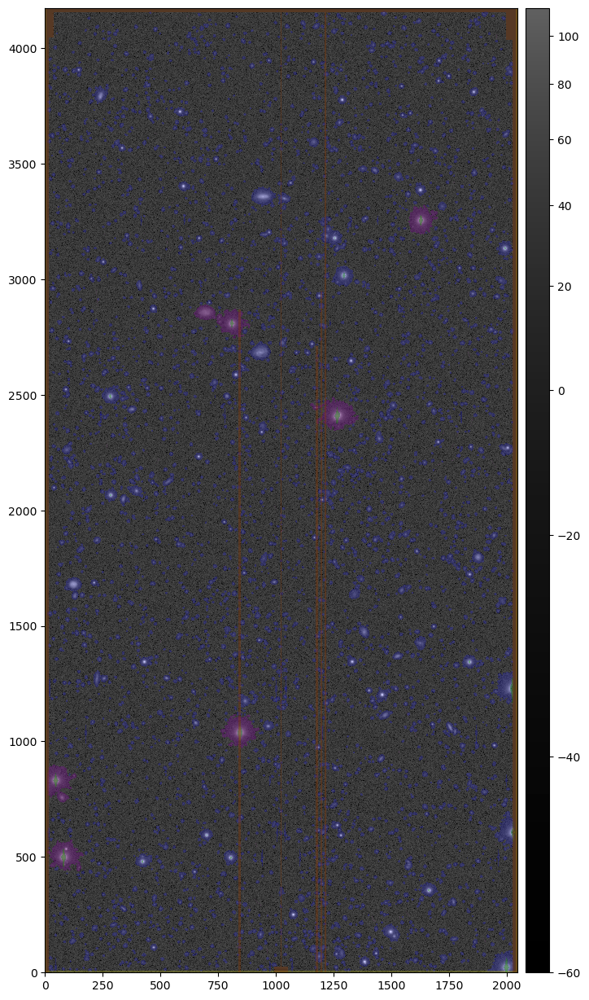

In [107]:
show_image_with_mask_plane(calexp)

In [108]:
difference = butler.get("goodSeeingDiff_differenceExp", dataId=visit_dict[11704]["dataId"])

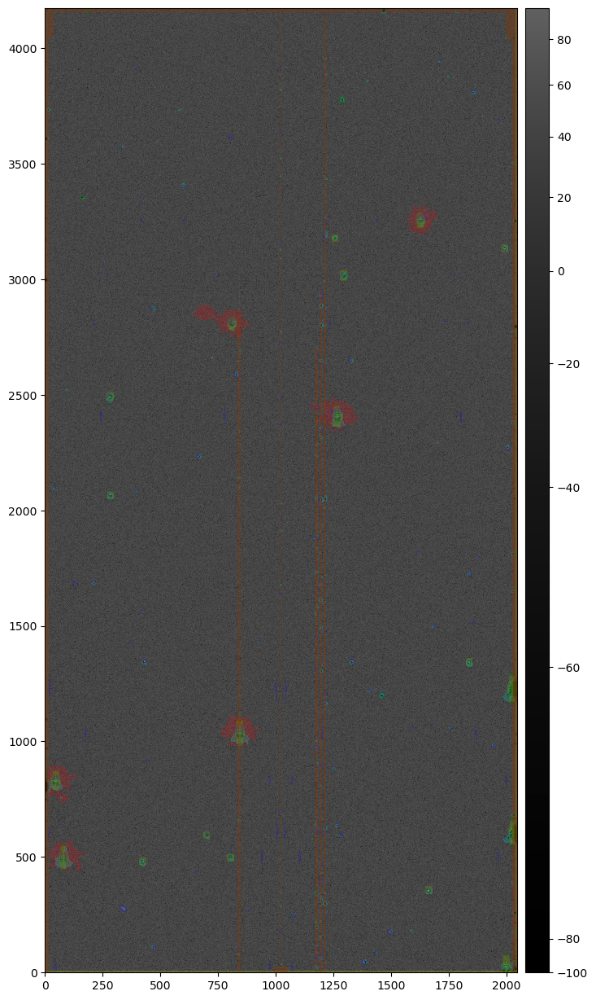

In [109]:
show_image_with_mask_plane(difference)

In [110]:
preconv_run["run_name"]

'Pre-convolution'

In [111]:
difference = preconv_run["butler"].get("goodSeeingDiff_differenceExp", dataId=visit_dict[11704]["dataId"])

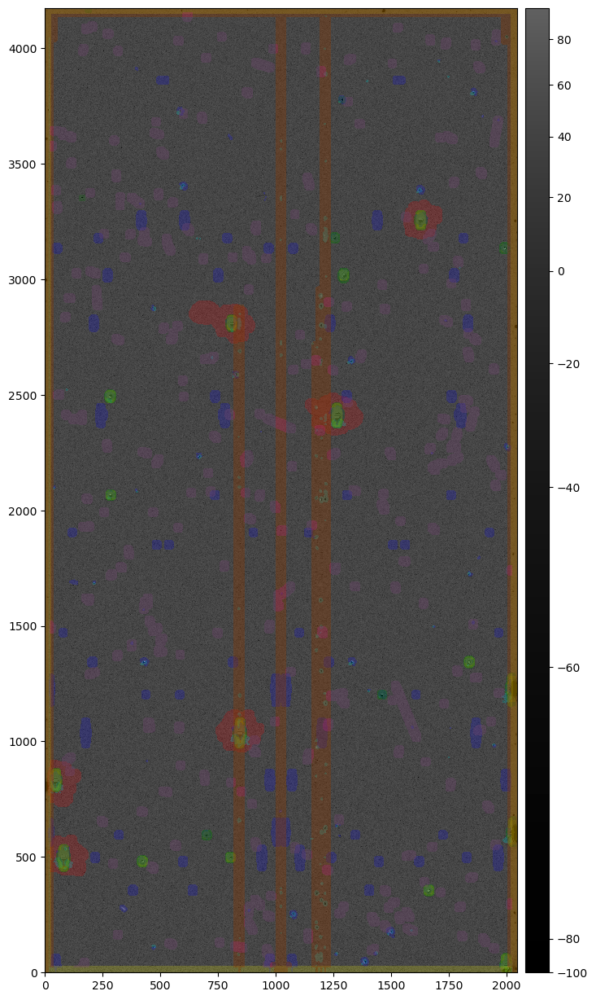

In [112]:
show_image_with_mask_plane(difference)

In [113]:
difference = auto_run["butler"].get("goodSeeingDiff_differenceExp", dataId=visit_dict[11704]["dataId"])

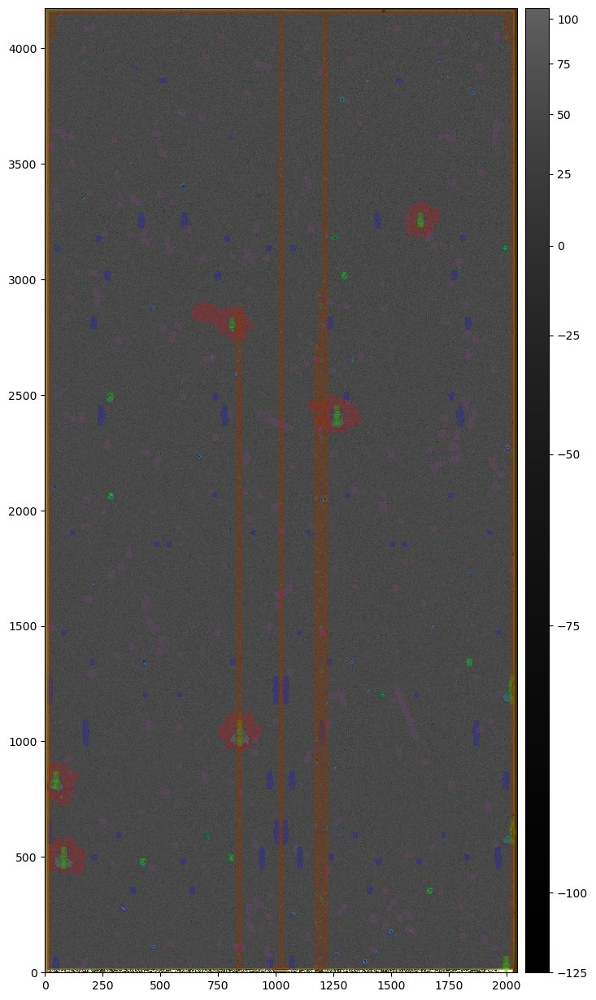

In [114]:
show_image_with_mask_plane(difference)

Number of sources: 2337
Number of sources: 2157
Number of sources: 2083


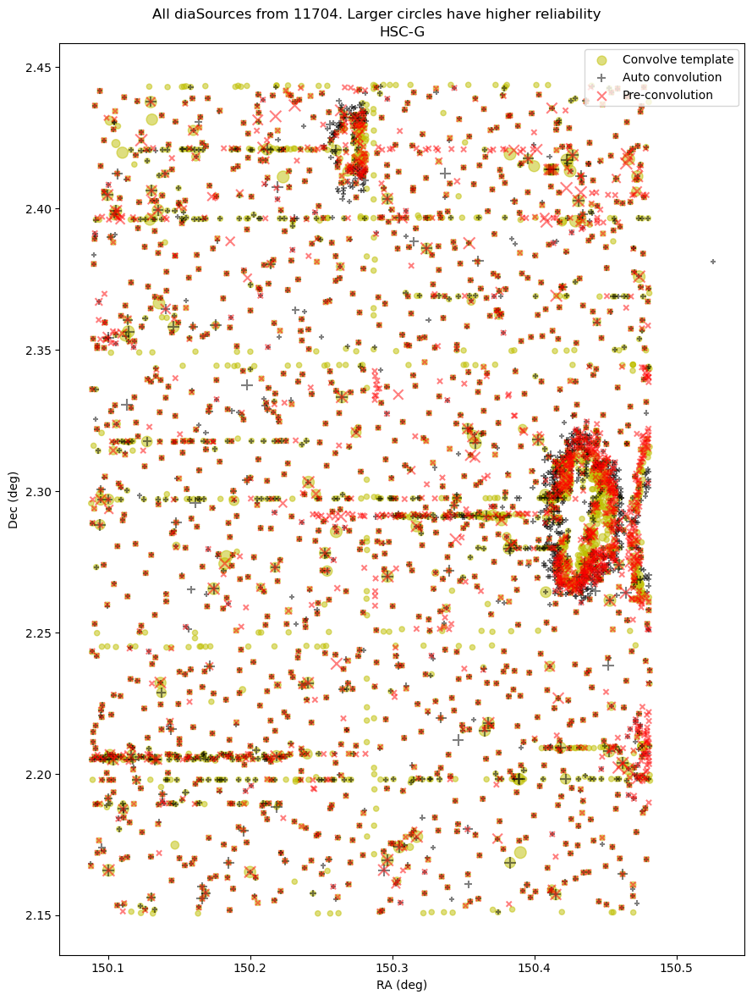

In [115]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('All diaSources from 11704. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['srcTable']['reliability']*100
    visit_select = run_dict['srcTable']['visit'] == 11704
    print(f"Number of sources: {np.sum(visit_select)}")
    sizes = [max([s, 20]) for s in sizes[visit_select]]

    ax.scatter(run_dict['srcTable']['ra'][visit_select],
               run_dict['srcTable']['dec'][visit_select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

Number of sources: 1361
Number of sources: 1346
Number of sources: 1262


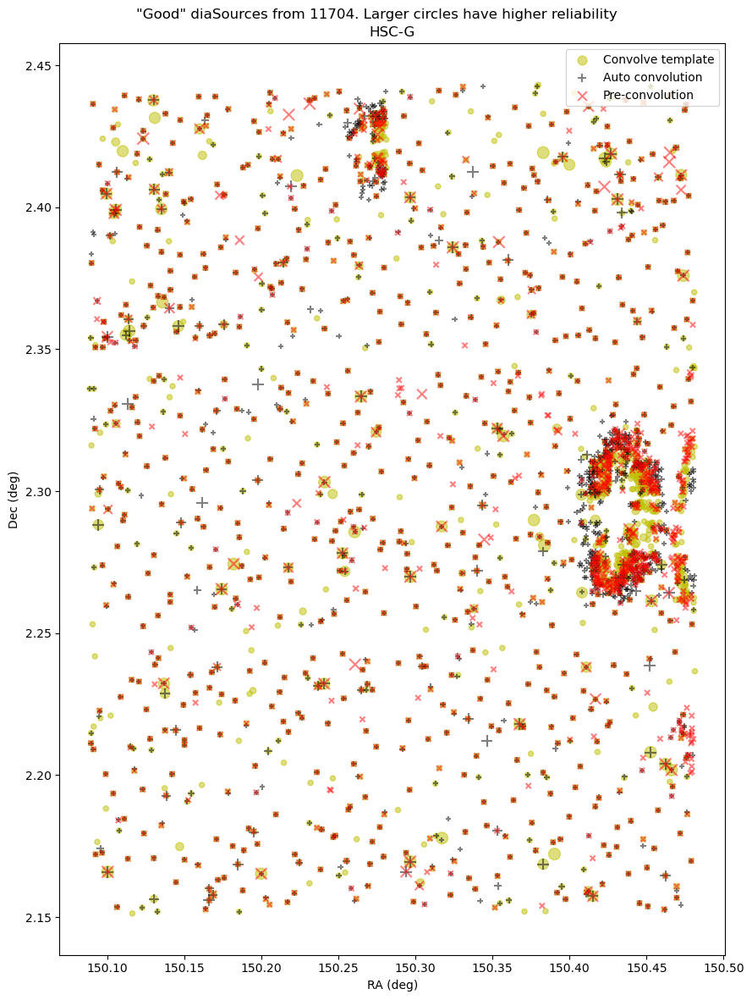

In [116]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('"Good" diaSources from 11704. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['goodSrc']['reliability']*100
    visit_select = run_dict['goodSrc']['visit'] == 11704
    print(f"Number of sources: {np.sum(visit_select)}")
    sizes = [max([s, 20]) for s in sizes[visit_select]]

    ax.scatter(run_dict['goodSrc']['ra'][visit_select],
               run_dict['goodSrc']['dec'][visit_select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

Number of sources: 976
Number of sources: 811
Number of sources: 821


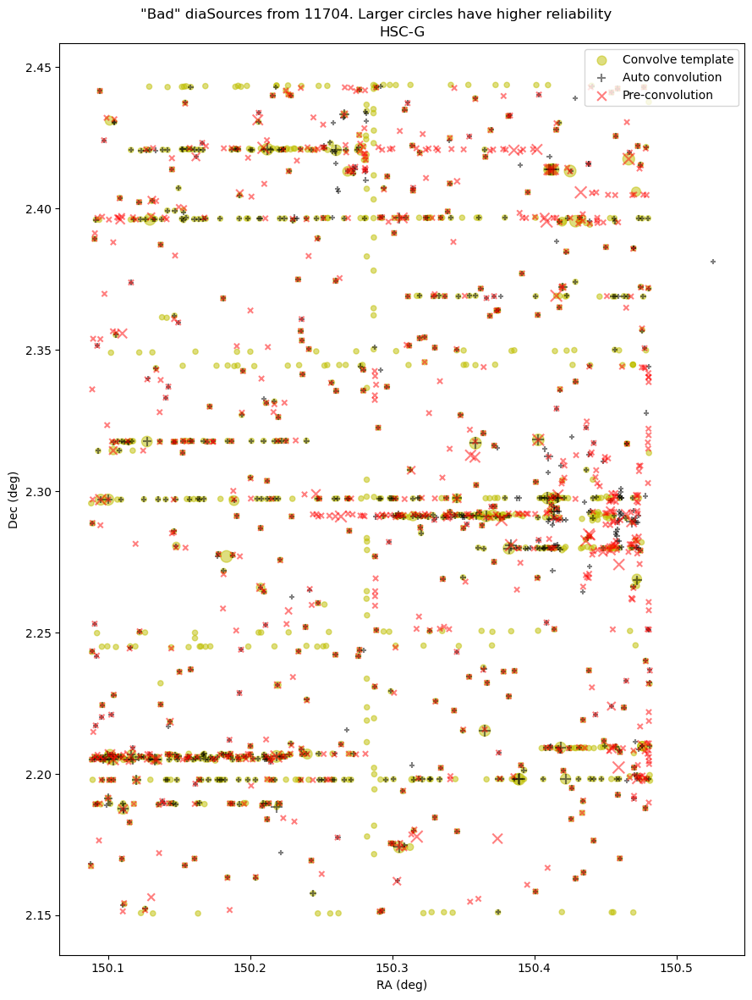

In [117]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('"Bad" diaSources from 11704. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['badSrc']['reliability']*100
    visit_select = run_dict['badSrc']['visit'] == 11704
    print(f"Number of sources: {np.sum(visit_select)}")
    sizes = [max([s, 20]) for s in sizes[visit_select]]

    ax.scatter(run_dict['badSrc']['ra'][visit_select],
               run_dict['badSrc']['dec'][visit_select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

Number of sources: 99
Number of sources: 89
Number of sources: 92


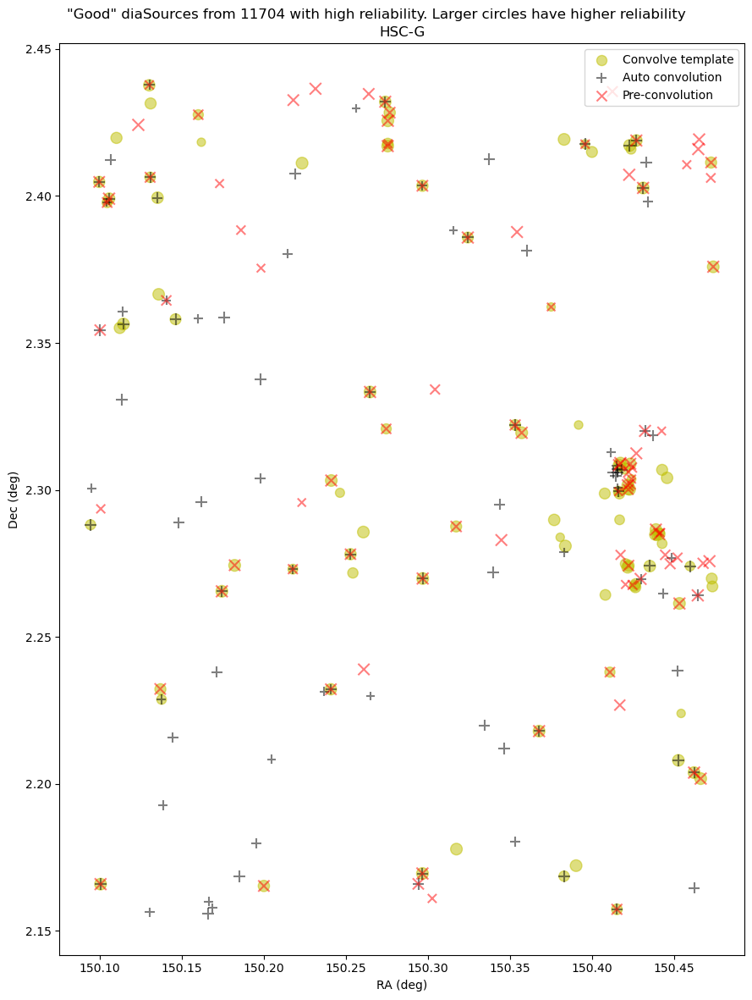

In [118]:
fig, ax = plt.subplots(1, 1, figsize=(9, 12), sharex=True, sharey=True)

fig.suptitle('"Good" diaSources from 11704 with high reliability. Larger circles have higher reliability')

for i_run, run_dict in enumerate([default_run, auto_run, preconv_run]):

    ax.set_ylabel('Dec (deg)')
    if i_run==2:
        ax.set_xlabel('RA (deg)')
    if i_run==0:
        ax.set_title('HSC-G')
    
    colorList = ['y', 'k', 'r']
    markerList = ['o', '+', 'x']
    sizes = run_dict['goodSrc']['reliability']*100
    visit_select = (run_dict['goodSrc']['visit'] == 11704) & (run_dict['goodSrc']['reliability'] > 0.5)
    print(f"Number of sources: {np.sum(visit_select)}")
    sizes = [max([s, 20]) for s in sizes[visit_select]]

    ax.scatter(run_dict['goodSrc']['ra'][visit_select],
               run_dict['goodSrc']['dec'][visit_select],
               s=sizes, 
               c=colorList[i_run], marker=markerList[i_run], alpha=0.5,
               label=run_dict['run_name'])
    ax.legend(loc='upper right')
#     axR.legend(loc='upper right')
plt.tight_layout()

There appears to be better agreement between template convolution and preconvolution for this visit, though all are still susceptible to even high-reliability artifacts near the bright star in the middle right.